Tiling demo

In [2]:
import numpy as np
import pandas as pd
import utm
import matplotlib.pyplot as plt
from nerd.mapping import generate_cell_from_coordinates, is_inside_tile, density_in_tile
from scipy.interpolate import griddata
from matplotlib import path
%matplotlib inline

NameError: name 'is_inside_tile' is not defined

In [3]:
columns = ["TMDAT","Fecha", "Hora","Lat", "Lon", "W","X","Y","Z"]

In [4]:
data = pd.read_csv('data/280320-06-95mm.txt', names=columns)

In [5]:
data["Este"],data["Norte"] = utm.from_latlon(data.Lat.values, data.Lon.values)[0:2]

In [6]:
spatial_resolution = 2
width = 65
r=int(width/2)
n = int(np.floor(width/spatial_resolution))
rr = np.linspace(-r,r,n)

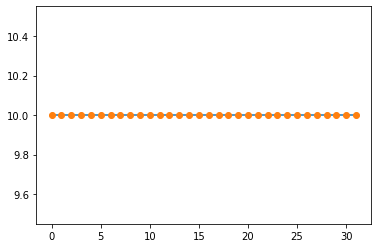

In [7]:
from nerd.density_functions import normal, uniform

normal_density_array = uniform(rr, width, 10)
plt.plot(normal_density_array)
plt.plot(normal_density_array, 'o')

## generate tiles from coordinates example

(463821.51148779533,
 468026.73313376267,
 2053298.5203516495,
 2057195.2550715532)

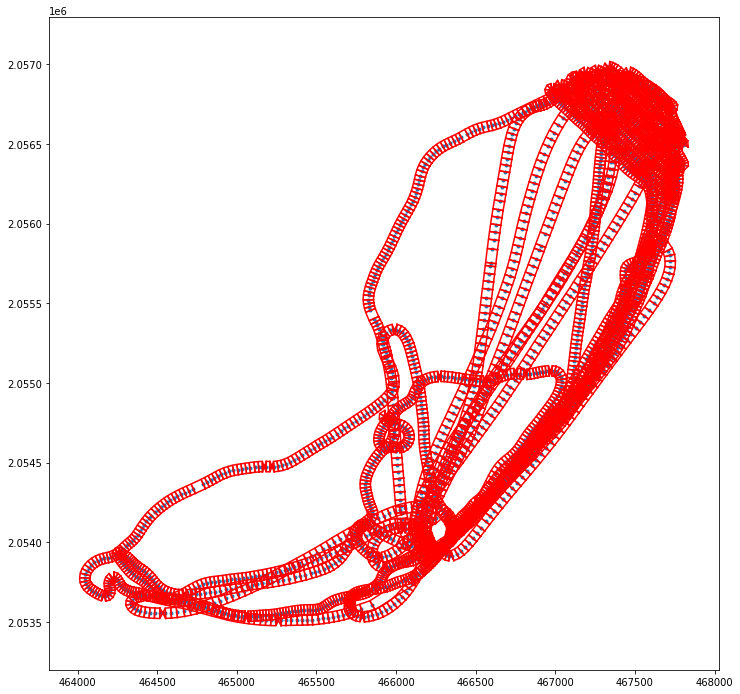

In [11]:
plt.figure(figsize=(12,12))
plt.plot(data.Este,data.Norte, '.')
for i in range(1,len(data)-2):
    x_rect, y_rect = generate_cell_from_coordinates(data.Este,data.Norte,i,width,spatial_resolution)
    plt.plot(x_rect,y_rect,'-r')
plt.axis('equal')

## Density in tiles


In [9]:
density_grid_in_tiles = []
x=np.arange(min(data.Este), max(data.Este), spatial_resolution)
y=np.arange(min(data.Norte), max(data.Norte), spatial_resolution)
x_grid, y_grid = np.meshgrid(x,y)
x_grid_ravel = np.ravel(x_grid)
y_grid_ravel = np.ravel(y_grid)
total_density = np.zeros_like(x_grid_ravel)
points = np.array([x_grid_ravel, y_grid_ravel]).T


for i in range(50,1000):
    if data.Y.iloc[i] == 0: #cubeta
        continue
    else: 
        print("Calculating density in tile {} of {}".format(i,len(data)-2))
        x_rect, y_rect = generate_cell_from_coordinates(data.Este,data.Norte,i,width,spatial_resolution)
        #x_rect, y_rect = check_directions(data.Este,data.Norte,i,x_rect, y_rect)
        inside_mask = is_inside_tile(x_rect, y_rect, points)
        sub_grid_x = x_grid_ravel[inside_mask]
        sub_grid_y = y_grid_ravel[inside_mask]
        cell_density = density_in_tile(x_rect,y_rect, normal_density_array,n)(sub_grid_x, sub_grid_y)
        total_density[inside_mask] = total_density[inside_mask] + cell_density

Calculating density in tile 279 of 4139
Calculating density in tile 280 of 4139
Calculating density in tile 281 of 4139
Calculating density in tile 282 of 4139
Calculating density in tile 283 of 4139
Calculating density in tile 284 of 4139
Calculating density in tile 285 of 4139
Calculating density in tile 286 of 4139
Calculating density in tile 287 of 4139
Calculating density in tile 288 of 4139
Calculating density in tile 289 of 4139
Calculating density in tile 290 of 4139
Calculating density in tile 291 of 4139
Calculating density in tile 292 of 4139
Calculating density in tile 293 of 4139
Calculating density in tile 294 of 4139
Calculating density in tile 295 of 4139
Calculating density in tile 305 of 4139
Calculating density in tile 306 of 4139
Calculating density in tile 307 of 4139
Calculating density in tile 308 of 4139
Calculating density in tile 309 of 4139
Calculating density in tile 310 of 4139
Calculating density in tile 311 of 4139
Calculating density in tile 312 of 4139


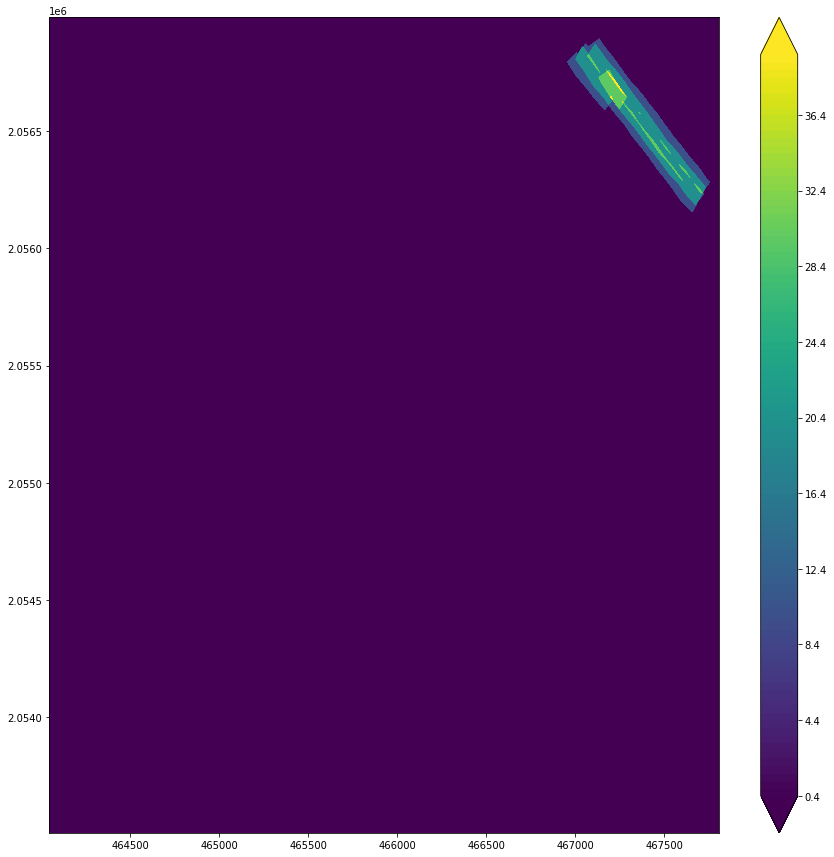

In [10]:
plt.figure(figsize=(15,15))
total_density_reshaped = np.reshape(total_density,x_grid.shape)
plt.contourf(x_grid, y_grid, total_density_reshaped, 100, extend="both")
plt.colorbar()

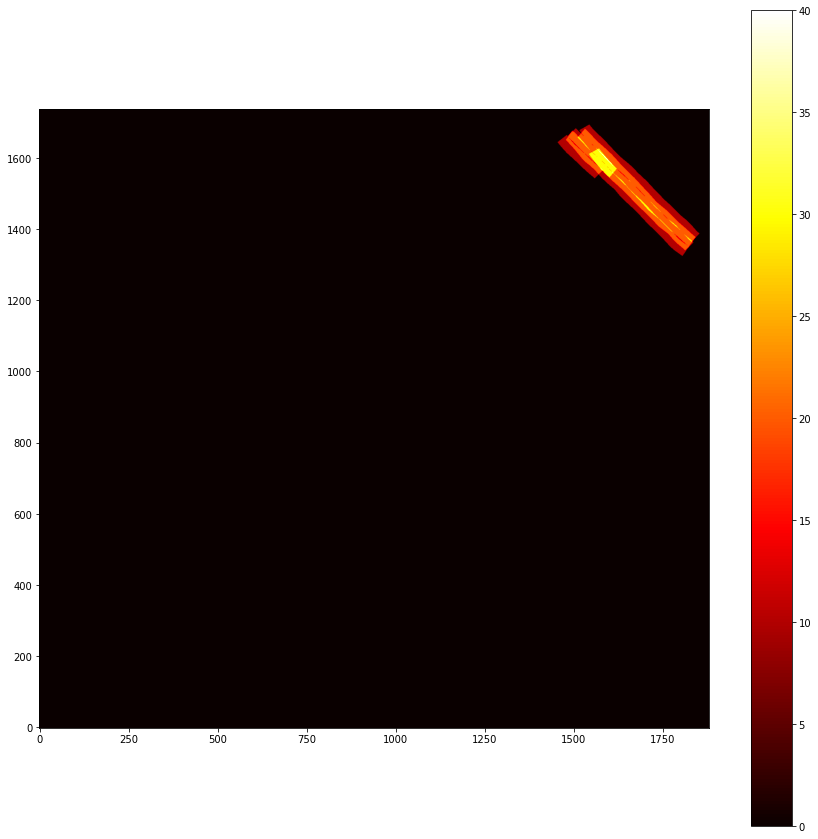

In [11]:
plt.figure(figsize=(15,15))
total_density_reshaped = np.reshape(total_density,x_grid.shape)
plt.imshow(total_density_reshaped, vmin=0, vmax=np.max(total_density), cmap="hot", origin='lower')
plt.colorbar()

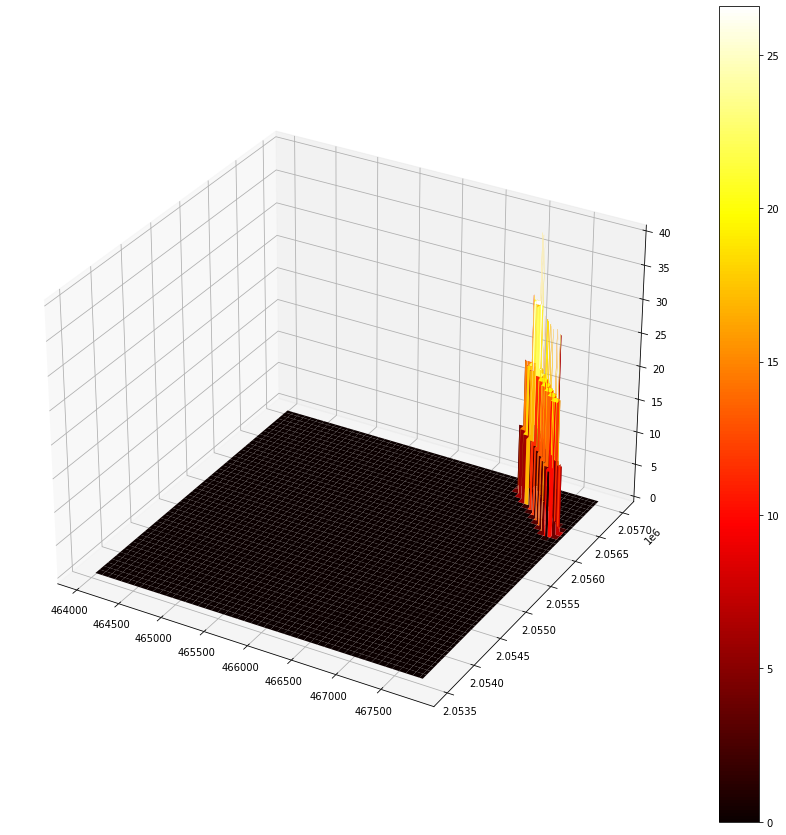

In [12]:

fig, ax = plt.subplots(subplot_kw={"projection": "3d"}, figsize=(15,15))
nerd = ax.plot_surface(x_grid, y_grid, total_density_reshaped, cmap='hot')
fig.colorbar(nerd)

In [ ]:
cell_density = density_grid_in_tiles[i]()